In [1]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

# Поиск изображений по запросу  

Вам поручено разработать демонстрационную версию поиска изображений по запросу.

Для демонстрационной версии нужно обучить модель, которая получит векторное представление изображения, векторное представление текста, а на выходе выдаст число от 0 до 1 — покажет, насколько текст и картинка подходят друг другу.

Данные лежат в папке `/datasets/image_search/`.  

В файле `train_dataset.csv` находится информация, необходимая для обучения: имя файла изображения, идентификатор описания и текст описания. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `train_images` содержатся изображения для тренировки модели.

В файле `CrowdAnnotations.tsv` — данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.
3. Доля людей, подтвердивших, что описание соответствует изображению.
4. Количество человек, подтвердивших, что описание соответствует изображению.
5. Количество человек, подтвердивших, что описание не соответствует изображению.

В файле `ExpertAnnotations.tsv` содержатся данные по соответствию изображения и описания, полученные в результате опроса экспертов. Номера колонок и соответствующий тип данных:

1. Имя файла изображения.
2. Идентификатор описания.

3, 4, 5 — оценки трёх экспертов.

Эксперты ставят оценки по шкале от 1 до 4, где 1 — изображение и запрос совершенно не соответствуют друг другу, 2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует, 3 — запрос и текст соответствуют с точностью до некоторых деталей, 4 — запрос и текст соответствуют полностью.

В файле `test_queries.csv` находится информация, необходимая для тестирования: идентификатор запроса, текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний. Идентификатор описания имеет формат `<имя файла изображения>#<порядковый номер описания>`.

В папке `test_images` содержатся изображения для тестирования модели.

## Исследовательский анализ данных

In [2]:
#!pip install phik -U
#!pip install optuna -U
#!pip install skorch
#!pip install sentence-transformers
#!pip install nltk
#!pip install hf_xet
#!pip install requests

In [3]:
import os
import re
import string
import warnings
import requests
import zipfile

import matplotlib.pyplot as plt
import nltk
import numpy as np
import optuna
import pandas as pd
import phik
import seaborn as sns
import torch
import torch.nn as nn
import torchvision.models as models
from IPython.display import display
from lightgbm import LGBMRegressor
from nltk.stem import WordNetLemmatizer
from PIL import Image
from sentence_transformers import SentenceTransformer
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GroupShuffleSplit, cross_val_score
from sklearn.preprocessing import MinMaxScaler
from skorch import NeuralNetRegressor
from tqdm import notebook
from torch.optim import Adam
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from transformers import (AutoModel, AutoTokenizer, ViTFeatureExtractor,
                          ViTForImageClassification)

In [4]:
SEED = 42
optuna.logging.set_verbosity(optuna.logging.WARNING)
warnings.filterwarnings('ignore')

### Загрузка данных

In [5]:
def get_df(file_name, sep=',', names=None, idx_col=None):
    path_to_file = os.path.relpath(
        os.path.join(base_dir, file_name)
    )
    if os.path.isfile(path_to_file):
        return pd.read_csv(path_to_file, sep=sep, names=names,
                           index_col=idx_col)
    raise Exception('Данные отсутствуют')

In [6]:
# 1. Ссылка на архив
url = "https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip"
zip_path = "dsplus_integrated_project_4.zip"

# 2. Скачиваем архив
if not os.path.exists(zip_path):
    print("Скачиваю архив...")
    r = requests.get(url)
    with open(zip_path, "wb") as f:
        f.write(r.content)
else:
    print("Архив скачан")

# 3. Распаковываем
with zipfile.ZipFile(zip_path, "r") as zip_ref:
    zip_ref.extractall(".")

# 4. Путь к папке с файлами
base_dir = os.path.join(".", "to_upload")

# 5. Функция для чтения датасетов
def get_df(file_name, sep=',', names=None, idx_col=None):
    path_to_file = os.path.join(base_dir, file_name)
    if os.path.isfile(path_to_file):
        return pd.read_csv(path_to_file, sep=sep, names=names,
                           index_col=idx_col)
    raise Exception('Данные отсутствуют')

# 6. Проверим список файлов
print(os.listdir(base_dir))


Архив скачан
['.DS_Store', 'CrowdAnnotations.tsv', 'ExpertAnnotations.tsv', 'test_images', 'test_images.csv', 'test_queries.csv', 'train_dataset.csv', 'train_images']


In [7]:
train_df = get_df('train_dataset.csv')
test_queries = get_df('test_queries.csv', sep='|', idx_col='Unnamed: 0')
ca_col_names = ['image', 'query_id', 'true_frac',
                'true_cnt', 'false_cnt']
crowd_annotations = get_df(
    'CrowdAnnotations.tsv', sep='\t', names=ca_col_names
)
expert_annotations = get_df(
    'ExpertAnnotations.tsv', sep='\t',
    names=ca_col_names[:2] + ['first_exp', 'second_exp', 'third_exp']
)
test_images = get_df('test_images.csv')

In [8]:
# создадим словарь с данными и пояснениями к ним
annotations_title = ('Данные по соответствию изображения и описания, '
                     'полученные')
data_dict = {
    'Датасет для обучения': train_df,
    'Датасет для тестирования': test_queries,
    annotations_title + ' с помощью краудсорсинга': crowd_annotations,
    annotations_title + ' в результате опроса экспертов': expert_annotations,
    'Изображения для тестирования модели': test_images
}

In [9]:
for title, item in data_dict.items():
    print(f'\033[1m{title}\033[0m\n')
    item.info()
    display(item.sample(10))
    print(f'Количество дубликатов: {item.duplicated().sum()}\n')

Датасет для обучения

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


,image,query_id,query_text
772,2443380641_7b38d18f5b.jpg,3028969146_26929ae0e8.jpg#2,A golden retriever running on short grass wear...
5229,3323988406_e3c8fce690.jpg,747921928_48eb02aab2.jpg#2,A child holds sparklers in the dark .
1504,143688283_a96ded20f1.jpg,1554713437_61b64527dd.jpg#2,A grey dog walks on top of a fallen tree in th...
5599,522063319_33827f1627.jpg,1262583859_653f1469a9.jpg#2,A man in a bright green shirt riding a bicycle...
4184,700884207_d3ec546494.jpg,3503689049_63212220be.jpg#2,a young man wearing dark sunglasses smiling
5772,3576259024_9c05b163aa.jpg,3538213870_9856a76b2a.jpg#2,A little girl twirls around in a flowery dress .
4564,3416091866_a96003d652.jpg,1836335410_de8313a64e.jpg#2,Man dressed up in black and brown and holding ...
2163,2192131110_8a40e7c028.jpg,3334537556_a2cf4e9b9a.jpg#2,Four people holding each others shoulders with...
3792,3145967309_b33abe4d84.jpg,3610683688_bbe6d725ed.jpg#2,A dog wading into the water
5737,415793623_6c1225ae27.jpg,2511019188_ca71775f2d.jpg#2,Two dark colored dogs romp in the grass with a...


Количество дубликатов: 0

Датасет для тестирования

<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


,query_id,query_text,image
162,2709359730_13bca100af.jpg#2,"Several dogs are running outside , with two ve...",2709359730_13bca100af.jpg
306,3386953179_84c2d7922f.jpg#1,A snowboarder in a red jacket slides down a sn...,3386953179_84c2d7922f.jpg
276,3247693965_845b3b4349.jpg#1,A dog is pulling a red sled across the snow .,3247693965_845b3b4349.jpg
483,957682378_46c3b07bcd.jpg#3,Two dogs are wrestling in a field .,957682378_46c3b07bcd.jpg
225,3091962081_194f2f3bd4.jpg#0,A man wearing glasses and black clothing is si...,3091962081_194f2f3bd4.jpg
51,1991806812_065f747689.jpg#1,A fighter attempts to kick another fighter whi...,1991806812_065f747689.jpg
90,2399219552_bbba0a9a59.jpg#0,A boy plays basketball .,2399219552_bbba0a9a59.jpg
100,2428094795_d3a8f46046.jpg#0,A child in a fuzzy blue hat on a tricycle .,2428094795_d3a8f46046.jpg
150,2687672606_275169c35d.jpg#0,A girl with Indian clothing on and henna on he...,2687672606_275169c35d.jpg
117,2461990494_c5ece064cc.jpg#2,An adult male wearing a backpack walks and loo...,2461990494_c5ece064cc.jpg


Количество дубликатов: 0

Данные по соответствию изображения и описания, полученные с помощью краудсорсинга

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   image      47830 non-null  object 
 1   query_id   47830 non-null  object 
 2   true_frac  47830 non-null  float64
 3   true_cnt   47830 non-null  int64  
 4   false_cnt  47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


,image,query_id,true_frac,true_cnt,false_cnt
14482,2581066814_179d28f306.jpg,3640422448_a0f42e4559.jpg#2,0.0,0,3
40590,3686924335_3c51e8834a.jpg,3396157719_6807d52a81.jpg#2,0.0,0,3
17611,2748729903_3c7c920c4d.jpg,3108197858_441ff38565.jpg#2,0.0,0,3
15717,2644430445_47c985a2ee.jpg,1773928579_5664a810dc.jpg#2,0.0,0,3
34655,3471841031_a949645ba8.jpg,2196107384_361d73a170.jpg#2,0.0,0,3
21623,2950905787_f2017d3e49.jpg,3364026240_645d533fda.jpg#2,0.0,0,3
5065,197504190_fd1fc3d4b7.jpg,3578914491_36019ba703.jpg#2,0.0,0,3
22807,3025549604_38b86198f5.jpg,3480051754_18e5802558.jpg#2,0.0,0,3
29877,327415627_6313d32a64.jpg,211295363_49010ca38d.jpg#2,0.0,0,3
46246,57422853_b5f6366081.jpg,541063517_35044c554a.jpg#2,0.0,0,3


Количество дубликатов: 0

Данные по соответствию изображения и описания, полученные в результате опроса экспертов

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   first_exp   5822 non-null   int64 
 3   second_exp  5822 non-null   int64 
 4   third_exp   5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.6+ KB


,image,query_id,first_exp,second_exp,third_exp
5720,791338571_7f38510bf7.jpg,2595186208_9b16fa0ee3.jpg#2,1,1,1
2589,2938747424_64e64784f0.jpg,2196846255_2c1635359a.jpg#2,3,3,4
2051,2696866120_254a0345bc.jpg,2928152792_b16c73434a.jpg#2,1,1,1
1301,2396691909_6b8c2f7c44.jpg,3280052365_c4644bf0a5.jpg#2,2,2,3
4870,3658427967_6e2e57458d.jpg,799486353_f665d7b0f0.jpg#2,1,1,2
3850,3353036763_4cbeba03b2.jpg,3245912109_fdeef6b456.jpg#2,1,1,1
5194,436009777_440c7679a1.jpg,2354540393_a149722680.jpg#2,1,1,1
1805,2594042571_2e4666507e.jpg,2594042571_2e4666507e.jpg#2,4,4,4
1617,2510020918_b2ca0fb2aa.jpg,3715469645_6d1dc019b3.jpg#2,1,1,1
5718,791338571_7f38510bf7.jpg,1467533293_a2656cc000.jpg#2,1,1,1


Количество дубликатов: 0

Изображения для тестирования модели

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   image   100 non-null    object
dtypes: object(1)
memory usage: 932.0+ bytes


,image
62,3119913014_688d4997d7.jpg
5,424307754_1e2f44d265.jpg
40,3466891862_9afde75568.jpg
25,3722572342_6904d11d52.jpg
37,440190907_bf8b7ba8ef.jpg
47,2709359730_13bca100af.jpg
65,3122579598_14841c038a.jpg
32,3030079705_0dee8a3e89.jpg
26,989754491_7e53fb4586.jpg
54,2714674623_8cd05ac114.jpg


Количество дубликатов: 0



Найдём среднее значение оценок экспертов и масштабируем его с помощью класса `MinMaxScaler`.

In [10]:
expert_annotations['exp_mean_score'] = expert_annotations.apply(
    lambda row: (row['first_exp'] + row['second_exp'] + row['third_exp']) / 3,
    axis=1
)

expert_annotations['exp_mean_score'] = MinMaxScaler().fit_transform(expert_annotations[['exp_mean_score']])

In [11]:
expert_annotations.sample(10)

,image,query_id,first_exp,second_exp,third_exp,exp_mean_score
49,1131800850_89c7ffd477.jpg,166507476_9be5b9852a.jpg#2,1,1,1,0.000000
3971,3393926562_66cc01b001.jpg,3569406219_f37ebf7b92.jpg#2,3,3,3,0.666667
2782,3025549604_38b86198f5.jpg,510531976_90bbee22a2.jpg#2,2,2,2,0.333333
5444,509778093_21236bb64d.jpg,766099402_cdda6964f0.jpg#2,1,1,1,0.000000
4533,3556598205_86c180769d.jpg,2600867924_cd502fc911.jpg#2,1,1,1,0.000000
2963,3085667865_fa001816be.jpg,2901880865_3fd7b66a45.jpg#2,3,4,4,0.888889
3433,3221036999_3f7b152d8a.jpg,3567061016_62768dcce1.jpg#2,1,1,1,0.000000
1812,2594902417_f65d8866a8.jpg,3537400880_8f410d747d.jpg#2,1,1,1,0.000000
4870,3658427967_6e2e57458d.jpg,799486353_f665d7b0f0.jpg#2,1,1,2,0.111111
4760,3613800013_5a54968ab0.jpg,249394748_2e4acfbbb5.jpg#2,3,3,3,0.666667


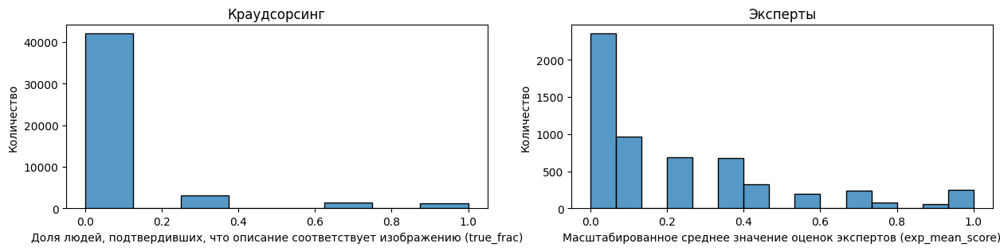

In [12]:
fig, axs = plt.subplots(1, 2, figsize=(15, 3))
series = [crowd_annotations['true_frac'],
          expert_annotations['exp_mean_score']]
bins_num = [8, 15]
sources = ['Краудсорсинг', 'Эксперты']
xlabels = [
    'Доля людей, подтвердивших, что описание '
    'соответствует изображению (true_frac)',
    'Масштабированное среднее значение оценок экспертов (exp_mean_score)'
]

for i in range(len(axs)):
    sns.histplot(series[i], bins=bins_num[i], ax=axs[i])
    axs[i].set_title(sources[i])
    axs[i].set_ylabel('Количество')
    axs[i].set_xlabel(xlabels[i])

Распределения оценок экспертов и респондентов похожи: основная часть картинок не соответствует описанию.

Объединим данные, полученные с помощью краудсорсинга и опроса экспертов, в одну таблицу.

In [13]:
annotations = crowd_annotations.merge(
    expert_annotations,
    how='outer',
    on=['image', 'query_id'],
    suffixes=('_crowd', '_expert')
)

In [14]:
display(annotations.sample(5))
annotations.info()

,image,query_id,true_frac,true_cnt,false_cnt,first_exp,second_exp,third_exp,exp_mean_score
33792,3354330935_de75be9d2f.jpg,466956209_2ffcea3941.jpg#2,0.000000,0.0,3.0,NaN,NaN,NaN,NaN
44523,3741462565_cc35966b7a.jpg,2505988632_9541f15583.jpg#2,0.000000,0.0,3.0,NaN,NaN,NaN,NaN
14131,2511019188_ca71775f2d.jpg,2496370758_a3fbc49837.jpg#2,0.333333,1.0,2.0,NaN,NaN,NaN,NaN
15127,2554081584_233bdf289a.jpg,2985679744_75a7102aab.jpg#2,0.000000,0.0,3.0,NaN,NaN,NaN,NaN
9250,226607225_44d696db6b.jpg,2900274587_f2cbca4c58.jpg#2,0.000000,0.0,3.0,NaN,NaN,NaN,NaN


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51323 entries, 0 to 51322
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image           51323 non-null  object 
 1   query_id        51323 non-null  object 
 2   true_frac       47830 non-null  float64
 3   true_cnt        47830 non-null  float64
 4   false_cnt       47830 non-null  float64
 5   first_exp       5822 non-null   float64
 6   second_exp      5822 non-null   float64
 7   third_exp       5822 non-null   float64
 8   exp_mean_score  5822 non-null   float64
dtypes: float64(7), object(2)
memory usage: 3.5+ MB


Можно предположить, что качество разметки экспертов, значительно выше в сравнении с данными, полученными методом краудсорсинга.  
Поэтому при обучении моделей воспользуемся оценками экспертов, несмотря на то, что количество изображений с оценками экспертов намного меньше по сравнению с оценками, полученными с помощью краудсорсинга.

In [15]:
df = train_df.merge(
    expert_annotations,
    how='outer',
    on=['image', 'query_id']
)

print(df.index.is_monotonic_increasing)
print(df.index.is_unique)
df.info()
df.sample(20)

True
True
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image           5822 non-null   object 
 1   query_id        5822 non-null   object 
 2   query_text      5822 non-null   object 
 3   first_exp       5822 non-null   int64  
 4   second_exp      5822 non-null   int64  
 5   third_exp       5822 non-null   int64  
 6   exp_mean_score  5822 non-null   float64
dtypes: float64(1), int64(3), object(3)
memory usage: 318.5+ KB


,image,query_id,query_text,first_exp,second_exp,third_exp,exp_mean_score
2965,3085667865_fa001816be.jpg,3406930103_4db7b4dde0.jpg#2,A golden dog looks alert as he stands in snow .,1,1,1,0.000000
1160,2308271254_27fb466eb4.jpg,2607462776_78e639d891.jpg#2,A black dog jumps into the water off a dock .,2,2,3,0.444444
1957,2652522323_9218afd8c2.jpg,1446053356_a924b4893f.jpg#2,Two girls in soccer strips are playing on a sp...,1,2,3,0.333333
932,2196846255_2c1635359a.jpg,2308271254_27fb466eb4.jpg#2,Two dogs moving through water close to the sho...,3,3,3,0.666667
2417,2886411666_72d8b12ce4.jpg,2763044275_aa498eb88b.jpg#2,Five black dogs running across the grass .,3,3,3,0.666667
4517,3549583146_3e8bb2f7e9.jpg,2544182005_3aa1332bf9.jpg#2,A young child is riding a purple bike .,3,3,3,0.666667
1375,2431832075_00aa1a4457.jpg,1490670858_e122df2560.jpg#2,A little boy slides down a bright red corkscre...,1,1,1,0.000000
2608,2944362789_aebbc22db4.jpg,197107117_4b438b1872.jpg#2,A rock climber climbs in between two very larg...,1,1,1,0.000000
5140,421322723_3470543368.jpg,2415803492_56a673dc25.jpg#2,A man in a suit dances with a young girl in fr...,1,2,2,0.222222
5456,512101751_05a6d93e19.jpg,241346971_c100650320.jpg#2,The guy in the blue and white jersey is runnin...,1,1,1,0.000000


Найдем количество изображений, в которых эксперты разошлись во мнениях более чем на $2$ балла при оценке.

In [16]:
diff_opinion = (
    df
    .apply(lambda x: min([x['first_exp'], x['second_exp'], x['third_exp']]) < 2
           and max([x['first_exp'], x['second_exp'], x['third_exp']]) > 2, axis=1)
    .dropna()
)

diff_opinion = df[diff_opinion == True]

In [17]:
diff_percent = diff_opinion.shape[0] / df.shape[0] * 100
print(
    'Эксперты значительно разошлись во мнении относительно соответствия '
    f'текста запроса изображению примерно в {diff_percent:.0f}% случаев.'
)

Эксперты значительно разошлись во мнении относительно соответствия текста запроса изображению примерно в 2% случаев.


In [18]:
columns = ['image', 'query_text', 'first_exp', 'second_exp', 'third_exp']

def show_images(data, img_dir='train_images', cols=columns,
                fw_final=None, plot_rows=10, plot_cols=1,
                fig_size=(10, 40), base_dir=base_dir):
    path_to_img_dir = os.path.relpath(
        os.path.join(base_dir, img_dir)
    )
    fig, axs = plt.subplots(plot_rows, plot_cols, figsize=fig_size)
    plt.subplots_adjust(hspace=.7)

    i = 1
    for item, ax in notebook.tqdm(zip(data[cols].values, axs.flat)):
        try:
            if 'first_exp' in cols:
                img, img_txt, first_exp, second_exp, third_exp = item
                local_label = (f'first_exp: {first_exp}\nsecond_exp: '
                               f'{second_exp}\nthird_exp: {third_exp}')
            else:
                img, img_txt, prob = item
                local_label = f'Score: {prob:.2f}'
                query_txt_lem = ' '.join(
                    [lemmatizer.lemmatize(word)
                     for word in img_txt.lower().split()]
                )
                assert not (fw_final.search(query_txt_lem))
            ax.set_title(f'{i}. {img_txt}', fontsize=12)
            img_path = os.path.relpath(os.path.join(path_to_img_dir, img))
            local_image = Image.open(img_path)
            ax.imshow(local_image)
            ax.set_yticks([])
            ax.set_xticks([])
            ax.set_xlabel(local_label, fontsize=12)
        except:
            warning = ('This image is unavailable in your country '
                       'in compliance with local laws')
            ax.text(0.5, 0.5, warning, fontsize=15, c='r',
                    fontweight='bold', ha='center', va='center')
            ax.axis('off')
        ax.set_title(f'{i}. {img_txt}', fontsize=12)
        i += 1


    plt.tight_layout()

0it [00:00, ?it/s]

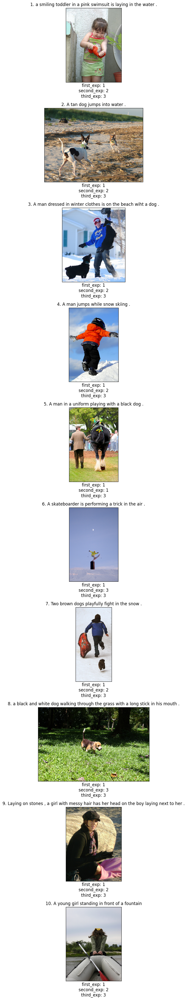

In [19]:
show_images(diff_opinion.sample(10))

In [20]:
annotations[['first_exp', 'second_exp', 'third_exp']].describe()

,first_exp,second_exp,third_exp
count,5822.000000,5822.000000,5822.000000
mean,1.436620,1.624356,1.881999
std,0.787084,0.856222,0.904087
min,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000
50%,1.000000,1.000000,2.000000
75%,2.000000,2.000000,2.000000
max,4.000000,4.000000,4.000000


Можно отметить, что первый эксперт в среднем строже относился к оцениваю соотвествия картинок и текста по сравнению с двумя другими экспертами

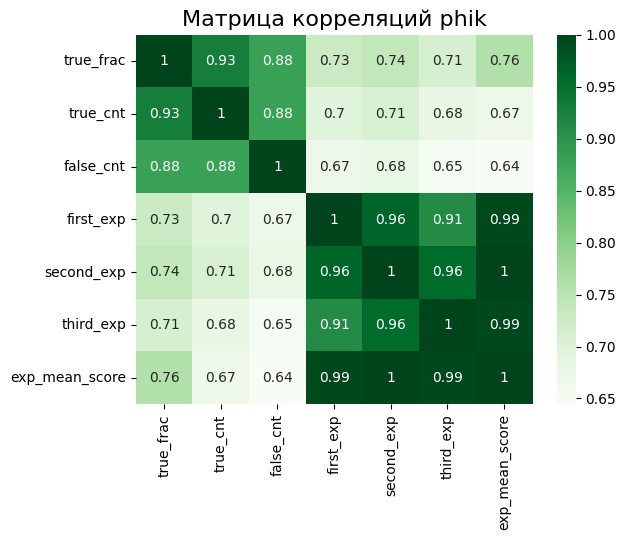

In [21]:
phik_overview = (
    annotations
    .drop(['image', 'query_id'], axis=1)
    .dropna()
    .phik_matrix(interval_cols=['exp_mean_score'])
)
sns.heatmap(data=phik_overview, annot=True, cmap="Greens")
plt.title("Матрица корреляций phik", fontsize=16)
plt.show()

Видим, что оценки, полученные посредством краудсорсинга, сильно коррелируют с мнением экспертов

In [22]:
unique_txt = train_df['query_text'].unique().shape[0]
unique_img = train_df['image'].unique().shape[0]
print(f'Количество уникальных текстов: {unique_txt}')
print(f'Количество уникальных изображений: {unique_img}')

Количество уникальных текстов: 977
Количество уникальных изображений: 1000


**Вывод по исследовательскому анализу данных**:

---
- пропуски и явные дубликаты в данных отсутствуют;
- добавили столбец `exp_mean_score`, содержащий агрегированное значение оценок эскпертов, и масштабировали его от 0 до 1 с помощью класса `MinMaxScaler`. 
- объединили оценки, полученные с помощью краудсорсинга и экспертов
- показали, что оценки, полученные с помощью краудсорсинга и экспертов сильно коррелируют
- выбрали для дальнейшего обучения оценки, полученные с помощью экспертов
- обучающая выборка содержит 977 уникальных текстов и 1000 уникальных изображений;  
- основываясь на оценках экспертов и данных, собранных с помощью краудсорсинга, можно сделать вывод, что большая часть текстов в наборе данных не соответствуют изображению;  

## Проверка данных
В некоторых странах, где работает ваша компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В вашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

```This image is unavailable in your country in compliance with local laws```

Однако у вас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

Чтобы исполнить это требование, создадим, для начала список, в который запишем слова, связанные с детьми и подростками:

In [23]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = (
    ViTForImageClassification
    .from_pretrained('nateraw/vit-age-classifier')
    .to(device)
)
transforms_vit = \
    ViTFeatureExtractor.from_pretrained('nateraw/vit-age-classifier')

Fetching 1 files:   0%|          | 0/1 [00:00<?, ?it/s]

In [24]:
nltk.download('wordnet')

punctuation = string.punctuation
lemmatizer = WordNetLemmatizer()
forbidden_words = [
    'kid', 'child', 'baby', 'teen', 'teenager', 'infant', 'youngster',
    'underaged', 'underage', 'toddler', 'boy', 'girl'
]
fw_pattern = '|'.join([rf'\b{word}\b' for word in forbidden_words])

dog_images = set(['2495931537_9b8d4474b6.jpg',
                  '3686924335_3c51e8834a.jpg',
                 '3720366614_dfa8fe1088.jpg'])

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Danila\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [25]:
def get_forbidden_img(data, model=model, transforms=transforms_vit,
                      device=device, base_dir=base_dir):
    path_to_img_dir = os.path.relpath(
        os.path.join(base_dir, 'train_images')
    )
    forbidden_img = []
    for img_name in notebook.tqdm(data['image'].values):
        img_path = os.path.relpath(os.path.join(path_to_img_dir, img_name))
        img = Image.open(img_path)
        inputs = transforms(img, return_tensors='pt').to(device)
        output = model(**inputs)
        proba = output.logits.softmax(1)
        preds = proba.argmax(1)
        if preds[0] < 3:
            forbidden_img.append(img_name)
    return forbidden_img

In [26]:
def clean_data(data, pattern=fw_pattern, punct=punctuation,
               lemmatizer=lemmatizer, dog_img=dog_images):
    data['clean_text'] = (
        data['query_text']
        .str.replace(rf'[{punctuation}]', '', regex=True)
        .str.strip()
        .str.lower()
    )
    data['clean_text'] = data['clean_text'].apply(
        lambda x: ' '.join([lemmatizer.lemmatize(word) for word in x.split()])
    )
    fw_idx = data.loc[
        data['clean_text'].str.contains(pattern, case=False, regex=True)
    ].index
    condition_1 = data.index.isin(fw_idx) & (data['exp_mean_score'] > 0.3)
    forbidden_images = data.loc[condition_1]['image'].unique()
    data = data.drop(data.loc[data['image'].isin(forbidden_images)].index,
                     axis=0)

    condition_2 = (
        data.index.isin(fw_idx)
        & (data['image'] == data['query_id'].str.split('#').str[0])
    )
    forbidden_images = data.loc[condition_2]['image'].unique()
    data = data.drop(data.loc[data['image'].isin(forbidden_images)].index,
                     axis=0)

    forbidden_images = set(get_forbidden_img(data.drop_duplicates(['image'])))
    forbidden_images = forbidden_images.difference(dog_img)
    condition_extra = data['image'].isin(forbidden_images)
    data = data.drop(data.loc[condition_extra].index, axis=0)
    return data

In [27]:
df = clean_data(data=df)
display(df.sample(5))
df.info()
df.shape

  0%|          | 0/749 [00:00<?, ?it/s]

,image,query_id,query_text,first_exp,second_exp,third_exp,exp_mean_score,clean_text
855,2167644298_100ca79f54.jpg,1490670858_e122df2560.jpg#2,A little boy slides down a bright red corkscre...,1,1,1,0.000000,a little boy slide down a bright red corkscrew...
3012,3108732084_565b423162.jpg,113678030_87a6a6e42e.jpg#2,Snowboarders sitting in the snow while skiers ...,2,2,3,0.444444,snowboarder sitting in the snow while skier ta...
3831,3348385580_10b53391f9.jpg,3359530430_249f51972c.jpg#2,People are watching a snowboarder perform a tr...,2,3,3,0.555556,people are watching a snowboarder perform a tr...
2586,2938120171_970564e3d8.jpg,429851331_b248ca01cd.jpg#2,A large wet yellow dog retrives his toy .,2,2,2,0.333333,a large wet yellow dog retrives his toy
2571,2933637854_984614e18b.jpg,3218480482_66af7587c8.jpg#2,A Miami basketball player dribbles by an Arizo...,1,1,2,0.111111,a miami basketball player dribble by an arizon...


<class 'pandas.core.frame.DataFrame'>
Index: 3933 entries, 0 to 5821
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   image           3933 non-null   object 
 1   query_id        3933 non-null   object 
 2   query_text      3933 non-null   object 
 3   first_exp       3933 non-null   int64  
 4   second_exp      3933 non-null   int64  
 5   third_exp       3933 non-null   int64  
 6   exp_mean_score  3933 non-null   float64
 7   clean_text      3933 non-null   object 
dtypes: float64(1), int64(3), object(4)
memory usage: 276.5+ KB


(3933, 8)

**Выводы по проверке данных**

---
- составлен список запрещённых слов, которые могут указывать на то, что на фотографии изображены дети;  
- тексты очищены от знаков препинания, переведены в нижний регистр и лемматизированы;  
- на основании составленного списка запрещённых слов удалены объекты, которые могут нарушать ограничения по обработке изображений.

## Векторизация изображений  

Перейдём к векторизации изображений.  
Самый примитивный способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Используем архитектуру `ResNet-18`, исключив полносвязные слои, которые отвечают за конечное предсказание. Загрузим модель данной архитектуры, предварительно натренированную на датасете `ImageNet`.

In [28]:
resnet = models.resnet18(pretrained=True)

for param in resnet.parameters():
    param.requires_grad_(False)

In [29]:
modules = list(resnet.children())[:-1]
resnet = nn.Sequential(*modules).to(device)

In [30]:
resnet.eval()
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                            std=[0.229, 0.224, 0.225])

preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    norm,
])

In [31]:
def get_features_img(vecs, idx):
    features_img = pd.DataFrame(
        index=idx, data=np.array(vecs),
        columns=[f'{i}_img' for i in range(len(vecs[0]))]
    )
    return features_img


def img_to_vec(data=df, img_dir='train_images',
               model_clip=False, base_dir=base_dir):
    img_dir_path = os.path.relpath(
        os.path.join(base_dir, img_dir)
    )
    unique_images = data['image'].unique()

    if model_clip:
        vectors = [
            model_clip.encode(Image.open(os.path.join(img_dir_path, img)))
            for img in notebook.tqdm(unique_images)
        ]
        return get_features_img(vectors, unique_images)

    vectors = []
    for img_name in notebook.tqdm(unique_images):
        img_path = \
            os.path.relpath(os.path.join(img_dir_path, img_name))
        img = Image.open(img_path).convert('RGB')
        image_tensor = preprocess(img).unsqueeze(0).to(device)
        output_tensor = resnet(image_tensor).flatten().to('cpu')
        vectors.append(output_tensor.numpy())
    return get_features_img(vectors, unique_images)

In [32]:
features_img = img_to_vec()

  0%|          | 0/691 [00:00<?, ?it/s]

**Выводы по векторизации изображений**

---
- написали функцию по переводу изображений в вектор с помощью модели `ResNet-18`

## Векторизация текстов  

Для векторизации текстов воспользуемся моделью `BERT`.

In [33]:
model_path = 'bert-base-uncased'
model = AutoModel.from_pretrained(model_path).to(device)
tokenizer = AutoTokenizer.from_pretrained(model_path)

In [34]:
batch_size = 100

class CustomDataset(torch.utils.data.Dataset):
    def __init__(self, data, attention_mask):
        self.data = data
        self.attention_mask = attention_mask

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        return self.data[idx], self.attention_mask[idx]


def process_batch(batch):
    batch, attention_mask_batch = batch
    batch = batch.to(device)
    attention_mask_batch = attention_mask_batch.to(device)
    with torch.no_grad():
        batch_embeddings = model(batch, attention_mask=attention_mask_batch)
    return batch_embeddings[0][:, 0, :].cpu().numpy()

In [35]:
def get_encoded_values(unique_texts):
    if len(unique_texts) > 1:
        unique_texts = unique_texts['query_text'].unique().tolist()

    encoded = tokenizer.batch_encode_plus(
        unique_texts, add_special_tokens=True,
        return_attention_mask=True, padding='max_length', truncation=True,
        return_token_type_ids=False, max_length=150, return_tensors='pt'
    )
    return encoded.values(), unique_texts


def txt_to_vec(data=df, batch_size=batch_size):
    values = get_encoded_values(data)
    padded, attention_mask = values[0]
    unique_texts = values[1]
    dataset = CustomDataset(padded, attention_mask)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

    if len(unique_texts) > 1:
        dataloader = notebook.tqdm(dataloader)
    embeddings = [process_batch(batch) for batch in dataloader]
    vectors_txt = np.concatenate(embeddings)

    features_txt = pd.DataFrame(
        index=unique_texts, data=np.array(vectors_txt),
        columns=[f'{i}_txt' for i in range(len(vectors_txt[0]))]
    )
    return features_txt

In [36]:
features_txt = txt_to_vec()

  0%|          | 0/10 [00:00<?, ?it/s]

In [37]:
df = df.drop(['first_exp', 'second_exp', 'third_exp'], axis=1)
df.head(5)

,image,query_id,query_text,exp_mean_score,clean_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000,a young child is wearing blue goggles and sitt...
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,A girl wearing a yellow shirt and sunglasses s...,0.111111,a girl wearing a yellow shirt and sunglass smile
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,A man sleeps under a blanket on a city street .,0.111111,a man sleep under a blanket on a city street
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,A woman plays with long red ribbons in an empt...,0.222222,a woman play with long red ribbon in an empty ...
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,Chinese market street in the winter time .,0.111111,chinese market street in the winter time


**Выводы по векторизации текстов**

---
- с помощью модели Bert произвели векторизацию текстов

## Объединение векторов

In [41]:
def merge_data(data, img_features, txt_features):
    data = data.merge(
        txt_features,
        how='outer',
        left_on='query_text',
        right_index=True
    )

    data = data.merge(
        img_features,
        how='outer',
        left_on='image',
        right_index=True
    )
    return data


def get_features(data, img_features, txt_features, train_data=True):
    merged_data = merge_data(data, img_features, txt_features)
    merged_data = merged_data.reset_index(drop=True)
    if train_data:
        groups = merged_data['image']
        to_drop = ['image', 'query_id', 'query_text', 'clean_text']
        merged_data = merged_data.drop(to_drop, axis=1)
        features = merged_data.drop('exp_mean_score', axis=1)
        target = merged_data['exp_mean_score']
        return features, target, groups

    to_drop = ['query_id', 'query_text', 'image']
    img_txt = merged_data[['image', 'query_text']]
    features = merged_data.drop(to_drop, axis=1)
    return features, img_txt

In [42]:
features, target, groups = get_features(data=df, img_features=features_img,
                                        txt_features=features_txt)

In [43]:
display(features.sample(10))
print(features.shape)
display(target.sample(10))
print(target.shape)
display(groups.sample(10))
groups.shape

,0_txt,1_txt,2_txt,3_txt,4_txt,5_txt,6_txt,7_txt,8_txt,9_txt,...,502_img,503_img,504_img,505_img,506_img,507_img,508_img,509_img,510_img,511_img
1669,-0.329462,0.234009,-0.972329,0.236277,0.003189,-0.233805,0.286802,0.921591,-0.347579,-0.265575,...,0.340502,0.243578,0.064279,1.467694,0.228058,0.842654,2.483138,0.595809,0.716612,1.019670
2080,-0.303099,-0.099780,-0.872137,0.215958,0.329456,-0.033530,-0.155717,1.056671,-0.560749,-0.298301,...,0.431713,0.447884,0.031791,0.281958,1.035212,0.477450,0.150082,0.881305,0.891175,0.712425
587,-0.707789,0.234578,-0.202205,0.134857,-0.339339,-0.386612,0.438051,0.572728,-0.422001,-0.030126,...,0.181513,1.969444,1.311916,0.325095,0.209890,0.130603,1.734523,0.069290,0.010717,1.486326
3239,-0.172558,-0.109719,-1.066926,0.162044,0.375553,-0.334807,-0.190376,0.927434,-0.252974,0.291847,...,0.811004,0.586972,0.432378,1.259926,2.305891,0.262073,0.325947,1.579948,0.941689,0.012638
3597,0.026952,0.177494,-0.497838,0.080585,0.108538,-0.492377,-0.089672,0.972985,-0.448209,-0.159919,...,0.126975,0.345982,0.591085,0.638333,0.066425,2.296008,1.183616,0.508940,0.911285,0.558984
2764,-0.290188,0.274842,-0.972572,0.033531,0.220114,-0.265775,-0.109610,0.945173,-0.224596,-0.435332,...,0.236975,1.113742,0.336655,0.068629,0.812057,0.197211,1.247121,5.434832,0.010101,2.354962
3080,-0.310041,-0.054388,-0.044137,0.233515,-0.156164,-0.399646,0.221661,0.644774,-0.410457,-0.431485,...,1.330335,0.218693,1.355617,0.565791,0.597814,2.210319,0.225085,1.150446,1.811169,0.687285
1831,-0.116687,0.281615,-0.235119,-0.237002,0.028530,-0.383650,0.547737,0.976374,-0.337130,-0.396978,...,1.375627,1.066859,0.130014,1.761678,0.420569,0.980313,0.800160,0.350803,1.142273,0.535085
1746,-0.026996,-0.038075,-0.498155,0.304721,0.134426,-0.423760,-0.117497,1.101419,-0.613998,-0.573949,...,0.243776,0.000000,1.034482,0.678207,1.043918,1.428707,0.015372,1.565647,5.662159,0.030953
3493,-0.245738,-0.301264,-0.272454,0.368298,-0.138365,-0.550770,0.225245,0.792089,-0.817347,-0.080491,...,1.503080,0.671184,1.863859,0.930305,0.621330,0.563355,3.084736,0.961424,0.463711,3.074625


(3933, 1280)


3165    0.000000
1075    0.111111
1968    0.000000
1414    0.333333
3403    0.111111
3311    0.666667
1858    0.000000
2831    0.000000
1783    0.111111
3114    0.000000
Name: exp_mean_score, dtype: float64

(3933,)


1265    2696866120_254a0345bc.jpg
2351    3245070961_8977fdd548.jpg
395      197504190_fd1fc3d4b7.jpg
3402    3715469645_6d1dc019b3.jpg
2260    3220161734_77f42734b9.jpg
479     2100816230_ff866fb352.jpg
1102    2559503010_84f20b3bc9.jpg
3907     909808296_23c427022d.jpg
314     1674612291_7154c5ab61.jpg
2502    3299820401_c2589186c5.jpg
Name: image, dtype: object

(3933,)

## Обучение модели предсказания соответствия  
Таргет - это непрерывные числа (лежащие в диапазоне от нуля до единицы), будем решать задачу регрессии. В качестве метрики будем использовать метрику `RMSE`. Таким образом, мы будем оценивать, насколько отличается вероятность верного описания картинки от той вероятности, которую мы ранее вычислили и поместили в значение таргета.

In [44]:
gss = GroupShuffleSplit(n_splits=1, test_size=.3, random_state=SEED)

idx_train, idx_valid = next(gss.split(X=features, y=target, groups=groups))

features_train, target_train = \
    features.loc[idx_train.tolist()], target.loc[idx_train]
features_valid, target_valid = \
    features.loc[idx_valid], target.loc[idx_valid]

groups_train = groups.loc[idx_train]

In [45]:
data_list = [features_train, features_valid, target_train, target_valid]

for item in data_list:
    display(item.sample(10))
    print(*item.shape)

,0_txt,1_txt,2_txt,3_txt,4_txt,5_txt,6_txt,7_txt,8_txt,9_txt,...,502_img,503_img,504_img,505_img,506_img,507_img,508_img,509_img,510_img,511_img
2894,-0.551541,-0.150534,0.418248,0.122361,-0.029309,-0.525163,0.330371,0.703376,-0.227188,-0.397522,...,0.599411,0.700678,0.829435,0.654397,0.265694,1.060148,0.545911,1.328740,2.316580,0.670235
3629,-0.200475,0.373329,0.254023,0.109353,-0.279211,-0.148364,0.250005,0.242824,-0.283231,-0.388877,...,3.219900,0.212056,1.167602,1.486613,1.071006,1.574266,0.638136,0.604112,2.594450,0.402040
2782,0.077160,0.179150,-0.387933,-0.370240,0.106809,-0.372255,0.241964,0.701498,-0.520143,-0.553587,...,0.119542,4.757672,0.118843,1.909500,1.684583,0.580784,0.767607,0.082099,2.607148,0.670071
1483,-0.552016,0.137727,-0.826957,-0.156018,0.138462,-0.084458,0.184940,0.621044,0.014030,-0.245265,...,0.688740,0.797833,0.966019,0.838685,0.382581,2.176519,0.345717,0.757189,2.191641,0.849496
509,-0.899205,0.019827,-0.924428,-0.085773,0.296396,0.031196,-0.162023,1.096773,-0.382280,-0.355593,...,1.918776,0.618641,0.098277,0.904459,0.382160,0.271176,0.188936,1.524383,0.044954,0.445348
1687,0.133443,0.224289,-0.359622,-0.119076,-0.157177,-0.303861,0.216387,0.635145,-0.483043,-0.220160,...,0.365557,0.148535,0.278108,0.672652,0.060544,0.370747,0.240449,0.321297,1.228451,0.505313
558,0.162884,0.325810,-0.163347,-0.274033,0.188599,-0.449889,0.089837,0.617624,-0.480109,-0.444342,...,0.462908,0.749482,0.588307,0.342893,2.586633,0.189618,0.092614,0.449897,2.635517,0.407867
940,0.115393,-0.003580,-0.568762,-0.237349,0.074613,-0.415137,0.163696,0.835074,-0.500109,-0.342552,...,0.472739,0.424517,0.021133,1.660708,0.592731,0.068987,0.434517,0.722377,0.519842,0.044268
3628,0.013897,0.214075,-0.564653,-0.182203,-0.059528,-0.165103,0.056718,0.663046,-0.413060,-0.357922,...,3.219900,0.212056,1.167602,1.486613,1.071006,1.574266,0.638136,0.604112,2.594450,0.402040
3886,-0.000092,0.614157,-0.688038,-0.137621,0.257568,-0.480226,0.085824,0.763533,-0.487220,-0.631068,...,4.737554,0.073379,3.132079,0.439321,1.079872,1.755729,2.640314,0.263554,2.247761,1.283614


2741 1280


,0_txt,1_txt,2_txt,3_txt,4_txt,5_txt,6_txt,7_txt,8_txt,9_txt,...,502_img,503_img,504_img,505_img,506_img,507_img,508_img,509_img,510_img,511_img
2874,0.014827,0.122532,-0.539947,0.069617,0.377752,-0.411174,0.347708,0.949063,-0.212360,-0.592969,...,0.515277,0.619325,1.107572,0.000000,0.352763,0.987134,0.631124,0.590702,0.976035,1.432087
201,-0.177162,-0.337789,-0.437898,0.557514,0.000284,-0.261836,0.453237,1.200783,-0.337489,-0.354418,...,0.370244,1.176066,0.374173,1.859351,1.255676,0.750983,2.318939,0.395016,0.484368,0.868186
1297,-0.652465,-0.460729,-1.050695,0.046241,0.358277,0.009825,-0.433502,1.180117,-0.413016,-0.066673,...,0.066906,0.000000,0.420192,0.034926,0.931595,0.045304,0.036325,0.843861,3.649169,0.193826
541,0.092641,-0.014443,-0.773665,0.126279,0.270162,-0.297442,-0.259314,1.306884,-0.451075,-0.296444,...,0.622329,0.633127,1.206213,0.323830,0.262857,0.257469,0.355353,0.529109,2.793677,0.061517
388,-0.730093,-0.387589,-1.238701,0.237800,0.267478,-0.079498,-0.419083,1.180973,-0.404551,-0.178604,...,0.246124,0.379355,0.395979,0.869553,0.192440,0.207377,2.099662,1.054987,0.204704,0.721873
432,0.093855,-0.224144,-0.341288,0.051625,-0.158289,0.017141,-0.522380,0.800435,-0.266370,-0.064057,...,0.126284,1.333243,0.167962,0.470518,0.080935,0.825129,0.242540,0.418809,0.769367,0.623681
2467,0.123331,0.576550,-0.256898,-0.410798,-0.311123,-0.622282,0.486166,0.821521,-0.146801,-0.344624,...,1.687529,0.112951,1.755709,0.193830,0.916092,0.581226,1.045290,0.344142,1.021492,0.573539
44,0.240973,0.425233,-0.143749,-0.181163,0.141570,-0.166517,0.100570,0.543813,-0.236658,-0.478184,...,1.349555,0.634391,0.887823,0.440676,0.058483,0.694958,0.636101,0.530108,0.338445,0.250554
1213,-0.824819,0.222888,-0.303308,-0.017129,0.108959,0.101484,-0.019553,0.700499,-0.568561,0.008106,...,1.412261,0.257994,1.453338,0.299107,1.051314,3.181483,0.580452,0.632794,1.144644,2.247787
1521,-0.242048,-0.105477,-0.999280,0.266529,0.204078,0.054315,-0.558543,1.201500,-0.699160,-0.166856,...,0.101452,0.874595,0.926927,1.015495,1.246768,0.955909,0.328816,1.767771,0.107693,0.874105


1192 1280


3100    0.111111
3484    0.222222
2714    0.333333
34      0.000000
552     0.333333
1153    0.000000
2767    0.111111
3210    0.666667
1898    0.000000
925     0.000000
Name: exp_mean_score, dtype: float64

2741


481     0.000000
1365    0.000000
1066    0.000000
3637    0.000000
2380    0.000000
2220    0.444444
203     0.111111
1923    0.777778
2608    0.666667
2810    0.000000
Name: exp_mean_score, dtype: float64

1192


In [46]:
class Net(nn.Module):
    def __init__(self, n_in_neurons, hidden_neurons=[50], n_out_neurons=1,
                 layers_num=1, means=[0], stds=[10], to_drop=[0]):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(n_in_neurons, hidden_neurons[0])
        self.act1 = nn.LeakyReLU()
        self.dp1 = nn.Dropout(p=to_drop[0])

        layers_num += 1
        self.layers_num = layers_num
        for i in range(2, layers_num):
            exec(f'self.fc{i} = '
                 f'nn.Linear(hidden_neurons[{i-2}], hidden_neurons[{i-1}])')
            exec(f'self.act{i} = nn.LeakyReLU()')
            exec(f'self.dp{i} = nn.Dropout(p=to_drop[{i-1}])')

        self.fcOUT = nn.Linear(hidden_neurons[-1], n_out_neurons)

        for i in range(1, layers_num):
            nn.init.kaiming_normal_(getattr(self, f'fc{i}').weight,
                                    mode='fan_in', nonlinearity='leaky_relu')
            nn.init.normal_(getattr(self, f'fc{i}').bias,
                            mean=means[i-1], std=stds[i-1])

    def forward(self, x):
        x = x.float()

        x = self.fc1(x)
        x = self.act1(x)
        x = self.dp1(x)

        for i in range(2, self.layers_num):
            x = getattr(self, f'fc{i}')(x)
            x = getattr(self, f'act{i}')(x)
            x = getattr(self, f'dp{i}')(x)

        x = self.fcOUT(x)
        return x

In [47]:
class MyNetRegressor(NeuralNetRegressor):
    def fit(self, X, y=None, **fit_params):
        y = (
            torch.from_numpy(y.values.astype('float32'))
            .float().reshape(-1, 1).to(device)
        )
        if not self.warm_start or not self.initialized_:
            self.initialize()

        self.partial_fit(X, y, **fit_params)
        return self

In [48]:
results_cv = {
    'Ridge': None,
    'NeuralNetRegressor': None,
    'LGBMRegressor': None
}

In [51]:
def objective(trial, X, y, grps, alpha=(0, 50), reg_al=(1e-2, .2),
              reg_lam=(1e-3, .1), clsmpl_btr=(0.7, 1), sbsmpl=(1e-2, 0.2),
              l_rt=(0.001, 0.01), depth=(20, 30), leaves=(200, 600),
              chld_smpls=(1, 30), cat_sm=(60, 90), num_layers=1,
              device=device, regressor='lr'):

    if regressor == 'lgb':
        lgb_params = {
            'n_estimators': trial.suggest_int('n_estimators', 150, 500),
            'reg_alpha': trial.suggest_float('reg_alpha', *reg_al, log=True),
            'reg_lambda':
                trial.suggest_float('reg_lambda', *reg_lam, log=True),
            'colsample_bytree': trial.suggest_float('colsample_bytree',
                                                    *clsmpl_btr),
            'subsample': trial.suggest_float('subsample', *sbsmpl),
            'learning_rate': trial.suggest_float('learning_rate', *l_rt),
            'max_depth': trial.suggest_int('max_depth', *depth),
            'num_leaves' : trial.suggest_int('num_leaves', *leaves),
            'min_child_samples': trial.suggest_int('min_child_samples',
                                                   *chld_smpls),
            'cat_smooth' : trial.suggest_int('cat_smooth', *cat_sm)
        }
        model = LGBMRegressor(**lgb_params, random_state=SEED, n_jobs=-1)

    elif regressor == 'lr':
        lr_params = {
            'alpha': trial.suggest_int('alpha', *alpha),
            'tol': trial.suggest_float('tol', 1e-4, 1)
        }
        model = Ridge(
            **lr_params,
            random_state=SEED
        )
    else:
        torch.manual_seed(SEED)
        hidden_neurons = []
        means = []
        stds = []
        to_drop = []
        num = num_layers + 1
        for i in range(1, num):
            hidden_neurons.append(
                trial.suggest_int(f'hidden_neurons_{i}', 5, 1000)
            )
            means.append(trial.suggest_int(f'mean_{i}', -10, 10))
            stds.append(trial.suggest_int(f'std_{i}', 1, 10))
            to_drop.append(trial.suggest_float(f'to_drop_{i}', 0, 0.5))
        params = {
            'module__layers_num': num_layers,
            'module__n_in_neurons': X.shape[1],
            'module__hidden_neurons': hidden_neurons,
            'module__means': means,
            'module__stds': stds,
            'optimizer__lr': trial.suggest_float('optimizer__lr', 1e-3, .3),
            'batch_size': trial.suggest_int('batch_size', 10, X.shape[0]),
            'module__to_drop': to_drop,
            'optimizer': torch.optim.Adam,
            'criterion': nn.MSELoss,
            'predict_nonlinearity': None,
            'max_epochs': trial.suggest_int('max_epochs', 50, 1000),
            'train_split': None,
            'verbose': 0,
            'device': device

        }
        model = MyNetRegressor(Net, **params)

    result = cross_val_score(
        model, X, y,
        scoring='neg_root_mean_squared_error',
        n_jobs=-1,
        cv=GroupShuffleSplit(n_splits=5, test_size=.2, random_state=SEED),
        groups=grps,
        error_score='raise'
    )
    return result.mean()

### Линейная регрессия

In [52]:
func = lambda trial: objective(trial, features_train, target_train,
                               groups_train, regressor='lr')
sampler = optuna.samplers.TPESampler(seed=SEED)
lr_study = optuna.create_study(direction='maximize', sampler=sampler)
lr_study.optimize(func, n_trials=30, show_progress_bar=True)

  0%|          | 0/30 [00:00<?, ?it/s]

In [54]:
results_cv['Ridge'] = - lr_study.best_value

### Нейронная сеть

In [56]:
func = lambda trial: objective(
    trial,
    features_train.values,
    target_train,
    grps=groups_train,
    regressor='nn'
)

sampler = optuna.samplers.TPESampler(seed=SEED)
nn_study = optuna.create_study(direction='maximize', sampler=sampler)
nn_study.optimize(func, n_trials=30, show_progress_bar=True)


  0%|          | 0/30 [00:00<?, ?it/s]

In [57]:
results_cv['NeuralNetRegressor'] = - nn_study.best_value

### Градиентный бустинг

In [58]:
func = lambda trial: objective(
    trial,
    features_train,
    target_train,
    groups_train,
    regressor='lgb'
)

sampler = optuna.samplers.TPESampler(seed=SEED)
lgb_study = optuna.create_study(direction='maximize', sampler=sampler)
lgb_study.optimize(func, n_trials=15, show_progress_bar=True)


  0%|          | 0/15 [00:00<?, ?it/s]

In [59]:
lgb_best_params = lgb_study.best_params

In [60]:
results_cv['LGBMRegressor'] = - lgb_study.best_value

In [61]:
pd.DataFrame(results_cv, index=['RMSE (кросс-валидация)']).round(3)

,Ridge,NeuralNetRegressor,LGBMRegressor
RMSE (кросс-валидация),0.283,0.251,0.248


Нейронная сеть и градиентный бустинг показали близкий результат, но лучше результат показала модель градиентного бустинга – будем использовать её на следующих этапах исследования.

In [62]:
# Dummy-модель для проверки
regressor_dummy = DummyRegressor(strategy='mean')
regressor_dummy.fit(features_train, target_train)
predicted_dummy = regressor_dummy.predict(features_valid)

print('RMSE (DummyRegressor): '
      f'{np.sqrt(mean_squared_error(target_valid, predicted_dummy)):.3f}')

RMSE (DummyRegressor): 0.274


Видим, что Dummy-модель показывает результат хуже. Значит, наша модель рабочая

In [63]:
%%time
regressor = LGBMRegressor(**lgb_best_params, random_state=SEED,
                          n_jobs=-1, verbose=-1)
regressor.fit(features_train, target_train)

predicted = regressor.predict(features_valid)

print('RMSE (LGBMRegressor): '
      f'{np.sqrt(mean_squared_error(target_valid, predicted)):.3f}')

RMSE (LGBMRegressor): 0.227
CPU times: total: 3min 43s
Wall time: 14.9 s


**Вывод по обучению моделей предсказания соответствия**:  

---
- данные разделены на обучающую и тестовую выборки в соотношении 7:3;  
- выполнено обучение трёх моделей: линейной регрессии, нейронной сети и градиентного бустинга;  
- для оценки качества модели выбрана метрика `RMSE`;  
- на кросс-валидации лучший результата продемонстрировала модель градиентного бустинга `RMSE = 0.248`.

## Тестирование модели

In [64]:
test_queries.sample(20)

,query_id,query_text,image
320,3398788809_25c71ba018.jpg#0,A group of friends play instruments in the mid...,3398788809_25c71ba018.jpg
69,2121140070_a09644550b.jpg#4,Men playing with a red ring out in the field .,2121140070_a09644550b.jpg
164,2709359730_13bca100af.jpg#4,Two puppies jump from a concrete slab onto the...,2709359730_13bca100af.jpg
14,123997871_6a9ca987b1.jpg#4,Women play lacrosse .,123997871_6a9ca987b1.jpg
124,2505056124_1276e8dbcb.jpg#4,Boy flying a distant kite .,2505056124_1276e8dbcb.jpg
63,2107838729_a527e434bd.jpg#3,A young boy throwing a rock into a pond in fro...,2107838729_a527e434bd.jpg
210,3044359043_627488ddf0.jpg#0,A black and white dog with a green collar stan...,3044359043_627488ddf0.jpg
24,1429546659_44cb09cbe2.jpg#4,Two dogs stand in the brown grass .,1429546659_44cb09cbe2.jpg
301,3356748019_2251399314.jpg#1,Three dirt bike racers head over a jump .,3356748019_2251399314.jpg
402,3601978895_9fec23ce0c.jpg#2,Two men are standing under what looks to be a ...,3601978895_9fec23ce0c.jpg


In [65]:
features_img_test = img_to_vec(data=test_queries, img_dir='test_images')

  0%|          | 0/100 [00:00<?, ?it/s]

In [66]:
features_txt_test = txt_to_vec(data=test_queries)

  0%|          | 0/5 [00:00<?, ?it/s]

In [67]:
features_test, img_txt_pred = get_features(
    data=test_queries, img_features=features_img_test,
    txt_features=features_txt_test, train_data=False
)

In [68]:
features = pd.concat([features_train, features_valid]).reset_index(drop=True)
target = pd.concat([target_train, target_valid]).reset_index(drop=True)

In [69]:
%%time
regressor_test = LGBMRegressor(**lgb_best_params, random_state=SEED,
                               n_jobs=-1, verbose=-1)
regressor_test.fit(features, target)

predicted_test = regressor_test.predict(features_test)

CPU times: total: 5min 23s
Wall time: 21.1 s


In [75]:
features_img_test

,0_img,1_img,2_img,3_img,4_img,5_img,6_img,7_img,8_img,9_img,...,502_img,503_img,504_img,505_img,506_img,507_img,508_img,509_img,510_img,511_img
1177994172_10d143cb8d.jpg,0.443538,2.334394,0.006315,2.395057,0.022517,0.329435,1.686328,1.900247,0.215611,0.033738,...,0.141508,0.322998,1.905792,1.066525,0.000000,2.231257,2.022047,2.291971,0.793287,0.850010
1232148178_4f45cc3284.jpg,0.837681,1.568771,1.887581,2.837070,0.734707,0.470185,0.825189,1.698581,1.027740,0.060962,...,2.110127,0.119341,0.799389,1.105238,1.748199,0.424679,0.182864,1.533272,1.345962,0.403836
123997871_6a9ca987b1.jpg,0.444045,0.826184,1.754453,1.081132,0.541890,0.970312,0.316091,0.812948,1.350305,1.810534,...,0.701766,0.281734,2.178066,1.092688,0.865970,1.919173,2.054221,1.667086,1.023286,1.040506
1319634306_816f21677f.jpg,0.335673,0.290847,1.497759,0.185853,0.180182,0.099677,1.703470,1.509805,0.905187,2.503216,...,0.336020,0.648820,0.139058,0.785978,0.806493,0.243152,0.269826,0.894762,0.453964,0.001881
1429546659_44cb09cbe2.jpg,0.189580,1.876004,0.826567,0.620639,2.310161,0.565663,0.033503,0.556100,0.402187,4.921101,...,0.878940,0.729889,0.114382,0.916448,0.860293,1.078834,0.486707,1.072945,0.846306,0.025188
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
862177617_c2c0581075.jpg,0.173574,1.375423,0.119206,0.174179,0.712436,1.601199,0.210288,0.179618,0.831572,0.199543,...,4.606791,0.216811,2.224272,0.144262,1.158075,1.172207,0.600528,0.675069,0.583626,2.083930
957682378_46c3b07bcd.jpg,1.071667,0.773127,0.342220,0.375746,2.559085,0.445131,0.232550,0.770942,0.493192,2.455469,...,1.228111,0.120487,0.531768,1.419766,0.813981,0.036427,0.113713,0.601073,0.450030,0.633549
973827791_467d83986e.jpg,1.316103,0.278986,0.036101,2.330490,0.851116,0.166069,0.927996,1.107432,0.271539,0.935161,...,0.486920,0.105443,1.807279,0.118976,0.009254,1.035061,0.383818,1.184553,1.912312,0.981194
989754491_7e53fb4586.jpg,0.447354,0.701219,1.468791,3.300311,0.136361,0.333417,0.667666,1.222236,0.706539,0.955077,...,0.008875,0.848444,0.979114,0.061595,0.965383,0.483132,0.706163,0.367165,1.108481,0.706131


In [70]:
fw_test = re.compile(fw_pattern)

In [71]:
def get_best_out_of_hundred(data, img_dir='test_images', cols=columns,
                            vectors_img=features_img_test,
                            reg_test=regressor_test,
                            fw_test=fw_test, model_clip=False,
                            plot_rows=10, plot_cols=1, fig_size=(10, 40),
                            base_dir=base_dir):
    path_to_img_dir = os.path.relpath(
        os.path.join(base_dir, img_dir)
    )
    fig, axs = plt.subplots(plot_rows, plot_cols, figsize=fig_size)
    plt.subplots_adjust(hspace=.7)

    query_texts = data['query_text'].values

    images = vectors_img.index
    X_img = vectors_img.reset_index(drop=True)

    i = 1
    for query_text, ax in notebook.tqdm(zip(query_texts, axs.flat)):
        ax.set_title(f'{i}. {query_text}', fontsize=12)
        query_txt_lem = ' '.join(
                [lemmatizer.lemmatize(word)
                 for word in query_text.lower().split()]
        )
        try:
            assert not (fw_test.search(query_txt_lem))
            if not model_clip:
                X_txt = txt_to_vec(data=[query_text])
                X_txt = X_txt.loc[
                    X_txt.index.values.repeat(100)
                ].reset_index(drop=True)

                X = pd.concat([X_txt, X_img], axis=1).set_index(images)
                local_predicted = reg_test.predict(X)
                X['pred'] = local_predicted
                img, score = X['pred'].idxmax(), X['pred'].max()

            else:
                vector_txt = model_clip.encode(query_text)
                scores = model_clip.similarity(X_img.values, vector_txt)
                best_score_idx = scores.argmax().item()
                img, score = \
                  images[best_score_idx], scores[best_score_idx].item()

            img_path = os.path.relpath(os.path.join(path_to_img_dir, img))
            local_image = Image.open(img_path)
            ax.imshow(local_image)
            ax.set_yticks([])
            ax.set_xticks([])
            ax.set_xlabel(f'Score: {score:.2f}', fontsize=12)
        except:
            warning = ('This image is unavailable in your country '
                       'in compliance with local laws')
            ax.text(0.5, 0.5, warning, fontsize=15, c='r',
                    fontweight='bold', ha='center', va='center')
            ax.axis('off')
        i +=1

    plt.tight_layout()

In [72]:
img_txt_pred.loc[:, 'prediction'] = predicted_test.copy()

In [73]:
max_score = (
    img_txt_pred
    .sort_values(by=['image', 'prediction'], ascending=False)
    .drop_duplicates(subset='image', keep='first')
)

0it [00:00, ?it/s]

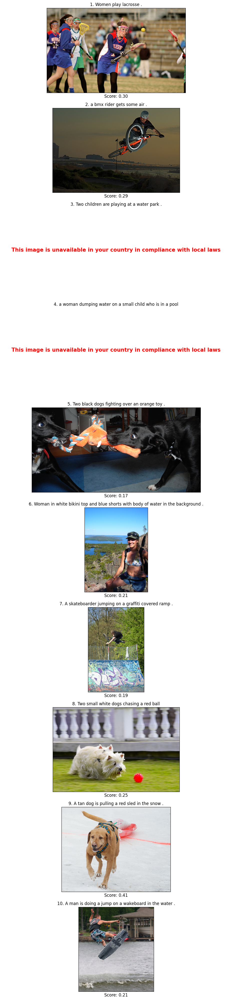

In [74]:
columns = ['image', 'query_text', 'prediction']
show_images(max_score.sample(10), 'test_images', columns, fw_test)

Можно отметить, что описание изображениий близки к тому, что на ней изображено.

### Поиск подходящего изображения среди всех фотографий тестового набора данных.

0it [00:00, ?it/s]

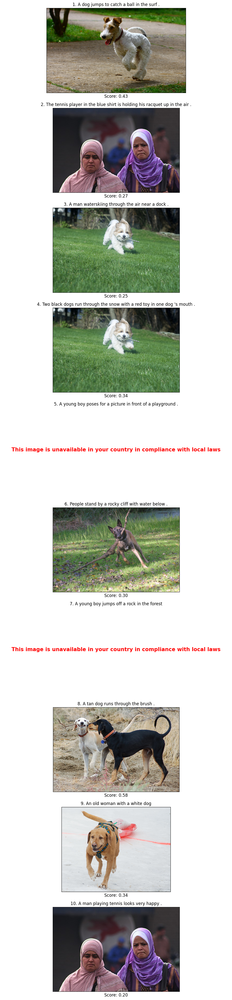

In [76]:
get_best_out_of_hundred(test_queries.sample(10))

Видим, что результат очень далек от желаемого. Попробуем для решения поставленной задачи применить нейронную сеть CLIP от OPEN AI.

In [78]:
model_clip = SentenceTransformer('clip-ViT-B-32')
features_img_clip = img_to_vec(data=test_queries, img_dir='test_images',
                               model_clip=model_clip)

modules.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md: 0.00B [00:00, ?B/s]

config.json: 0.00B [00:00, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/604 [00:00<?, ?B/s]

0_CLIPModel/model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

0_CLIPModel/pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


  0%|          | 0/100 [00:00<?, ?it/s]

0it [00:00, ?it/s]

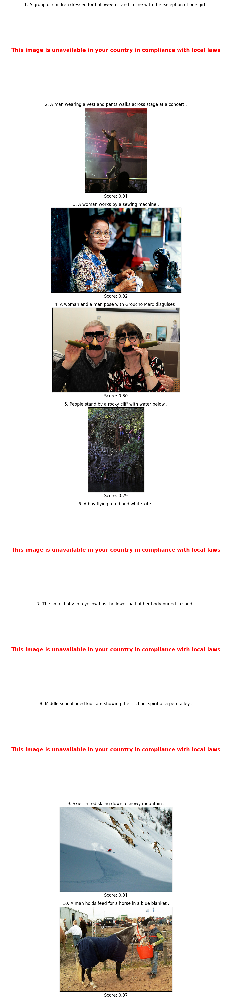

In [81]:
get_best_out_of_hundred(test_queries.sample(10), vectors_img=features_img_clip,
                        model_clip=model_clip)

Видим, что подбор изображений стал значительно лучше.

**Вывод по тестированию модели**:  

---
- получены эмбеддинги для всех тестовых изображений из папки `test_images`;  
- выбраны 10 случайных запросов из файла `test_queries.csv` и для каждого запроса выведено наиболее релевантное изображение;  
- для более качественного подбора изображений была использована нейронная сеть `CLIP`, что улучшило результат.

## Общий вывод

**Описание данных.**  

**train_dataset.csv**  
`image` - имя файла изображения  
`query_id` - идентификатор описания  
`query_text` - текст описания  

**CrowdAnnotations.tsv**  
`image` - имя файла изображения    
`query_id` - идентификатор описания  
`true_frac` - доля людей, подтвердивших, что описание соответствует изображению  
`true_cnt` - количество человек, подтвердивших, что описание соответствует изображению  
`false_cnt` - количество человек, подтвердивших, что описание не соответствует изображению

**ExpertAnnotations.tsv**  
`image` - имя файла изображения  
`query_id` - идентификатор описания  
`first_exp` - оценка первого эксперта  
`second_exp` - оценка второго эксперта  
`third_exp` - оценка третьего эксперта  

---
**Ход исследования**:  

---
-  **Выполнен исследовательский анализ данных**
    - пропуски и явные дубликаты в данных отсутствуют;
    - добавили столбец `exp_mean_score`, содержащий агрегированное значение оценок эскпертов, и масштабировали его от 0 до 1 с помощью класса `MinMaxScaler`. 
    - объединили оценки, полученные с помощью краудсорсинга и экспертов
    - показали, что оценки, полученные с помощью краудсорсинга и экспертов сильно коррелируют
    - выбрали для дальнейшего обучения оценки, полученные с помощью экспертов несмотря на их меньшее количество
    - обучающая выборка содержит 977 уникальных текстов и 1000 уникальных изображений;  
    - основываясь на оценках экспертов и данных, собранных с помощью краудсорсинга, можно сделать вывод, что большая часть текстов в наборе данных не соответствуют изображению;  
---
- **Проверка данных**
    - составлен список запрещённых слов и на основании составленного списка запрещённых слов удалены объекты, которые могут нарушать ограничения по обработке изображений;  
    - тексты очищены от знаков препинания, переведены в нижний регистр и лемматизированы;  
---
- **Векторизация изображений и текстов**
    - для векторизации изображений использовалась архитектура `ResNet-18`, тексты были переведены в вектор с помощью модели `BERT`;  
---
- **Обучение и тестирование модели**
    - данные разделены на обучающую и тестовую выборки в соотношении 7:3;
    - выполнено обучение трёх моделей: `линейной регрессии`, `нейронной сети` и `градиентного бустинга`;
    - для оценки качества модели выбрана метрика `RMSE`;
    - на кросс-валидации лучший результата продемонстрировала модель градиентного бустинга (`RMSE` = 0.248), поэтому была выбрана для финального тестирования; 
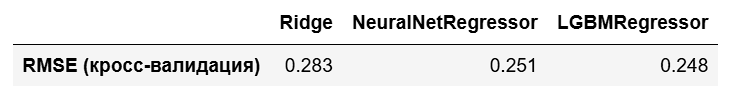
    - значение метрики `RMSE`, полученное на валидационной выборке: 0.227;  
    - для более качественного подбора изображений была использована нейронная сеть `CLIP`.

---
**Результат работы улучшенной модели**

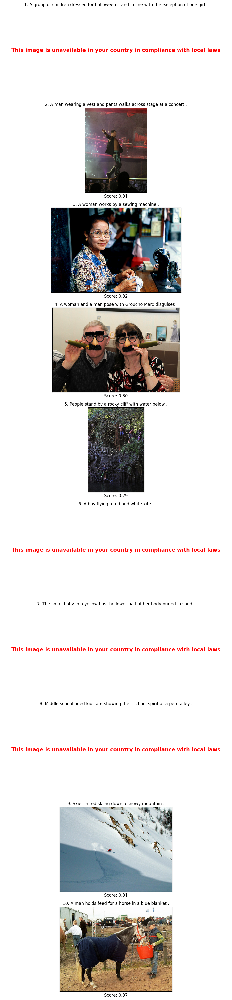